<a href="https://colab.research.google.com/github/samikshagadhave/YOLOv6_model/blob/main/Transmission_dataset_T51%2CT52%2CT53%2CT54%2CT55%2CT56_2_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:

%cd /content/gdrive/MyDrive/YOLOv6


/content/gdrive/MyDrive/YOLOv6


In [ ]:
!pip install -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 65.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 68.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 70.0 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.5
    Uninstalling numpy-1.23.5:
      Successfully uninstalled numpy-1.23.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires kaleido, which is not installed.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0.10 requires uvicorn, which is not installed.
cupy-cuda11x 11.0.0 requires numpy<1.26,>=1.20, but you have numpy 1.26.2 which is incompatible.


In [ ]:
!pip install numpy==1.23.4

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 81.8 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.2
    Uninstalling numpy-1.26.2:
      Successfully uninstalled numpy-1.26.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires kaleido, which is not installed.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0.10 requires uvicorn, which is not installed.
tensorflow 2.14.0 requires numpy>=1.23.5, but you have numpy 1.23.4 which is incompatible.


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="mwbsdPvkmXbwf9oRwN1g")
project = rf.workspace("samiksha-gadhave").project("transmission-dataset-t51-t52-t53-t54-t55-t56")
dataset = project.version(1).download("mt-yolov6")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Transmission-dataset--T51,T52,T53,T54,T55,T56-1 in mt-yolov6:: 100%|██████████| 18479/18479 [00:06<00:00, 2818.85it/s]


In [ ]:
#!python tools/train.py --batch 32 --conf configs/yolov6s.py --epochs 100   --img-size 416 --data {dataset.location}/data.yaml  --output-dir ./exp  --device 0

#!python tools/train.py   --resume
!python tools/train.py --output-dir ./exp/weights/last_ckpt.pt   --resume

2023-10-31 07:50:21.744050: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-10-31 07:50:21.744103: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-10-31 07:50:21.744140: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-10-31 07:50:21.751683: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-31 07:50:22.742890: W tensorflow/c

In [ ]:
!python tools/eval.py --data /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml --img-size 416 --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --device 0

Namespace(data='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', batch_size=32, img_size=416, conf_thres=0.03, iou_thres=0.65, task='val', device='0', half=False, save_dir='runs/val/', name='exp', shrink_size=0, infer_on_rect=True, reproduce_640_eval=False, eval_config_file='./configs/experiment/eval_640_repro.py', do_coco_metric=True, do_pr_metric=False, plot_curve=True, plot_confusion_matrix=False, verbose=False, config_file='', specific_shape=False, height=None, width=None)
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
Model Summary: Params: 18.50M, Gflops: 19.09
img record infomation path is:Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/.valid_cache.json
Val: Checking formats of labels with 2 process(es): 
761 label(s) found, 0 label(s) missing, 2 label(s) empty, 0 invalid la

In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0013_jpg.rf.65f4d4a1672f867f1e9f5b947e495d35.jpg   --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0013_jpg.rf.65f4d4a1672f867f1e9f5b947e495d35.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00,  2.68it/s]
Results saved to runs/inference/exp


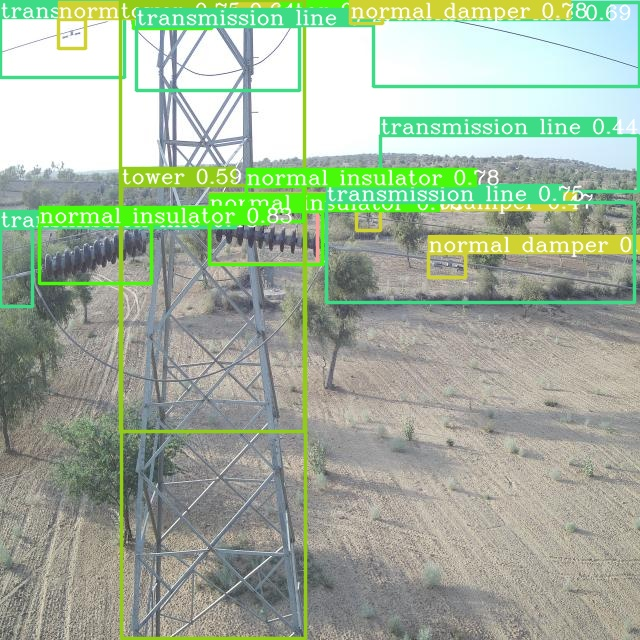

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0013_jpg.rf.65f4d4a1672f867f1e9f5b947e495d35.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0017-3_jpg.rf.d5c8c8e9c5bf7718d90d46e2ad02b684.jpg   --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0017-3_jpg.rf.d5c8c8e9c5bf7718d90d46e2ad02b684.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00,  8.27it/s]
Results saved to runs/inference/exp


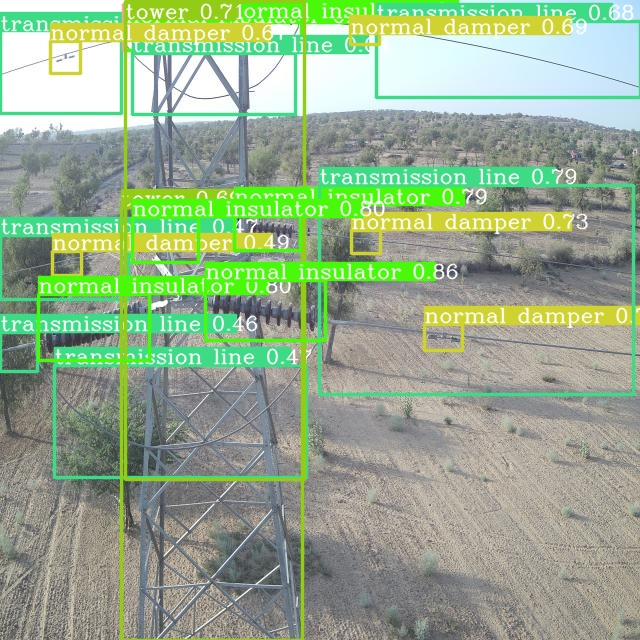

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0017-3_jpg.rf.d5c8c8e9c5bf7718d90d46e2ad02b684.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0019-1_jpg.rf.1d8c6b24d4f452cb1f9a84110d73f0f4.jpg   --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0019-1_jpg.rf.1d8c6b24d4f452cb1f9a84110d73f0f4.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 15.16it/s]
Results saved to runs/inference/exp


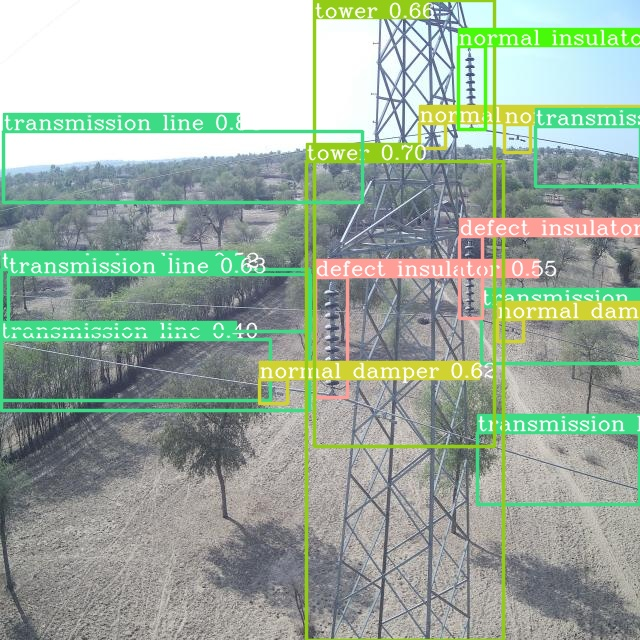

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0019-1_jpg.rf.1d8c6b24d4f452cb1f9a84110d73f0f4.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0025-3_jpg.rf.9c3c84b55d71a04348ba9b43bc258c69.jpg   --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0025-3_jpg.rf.9c3c84b55d71a04348ba9b43bc258c69.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 12.59it/s]
Results saved to runs/inference/exp


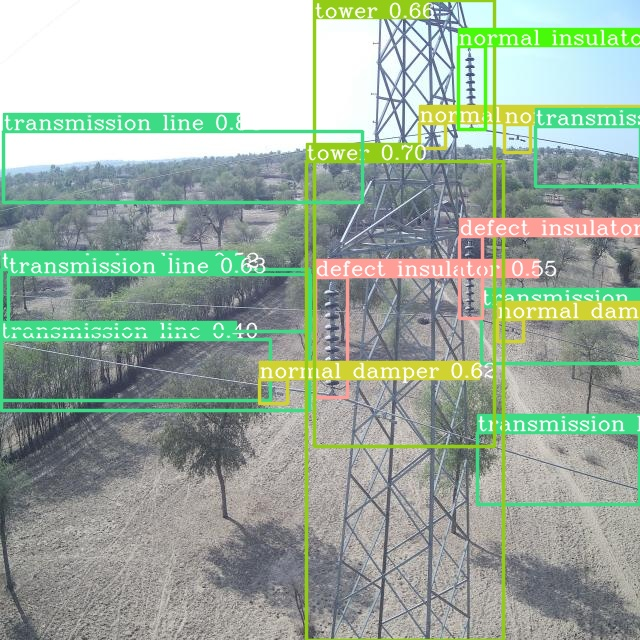

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0019-1_jpg.rf.1d8c6b24d4f452cb1f9a84110d73f0f4.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0029-1_jpg.rf.6f0e80345702393dfc6ea60654688623.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0029-1_jpg.rf.6f0e80345702393dfc6ea60654688623.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 11.73it/s]
Results saved to runs/inference/exp


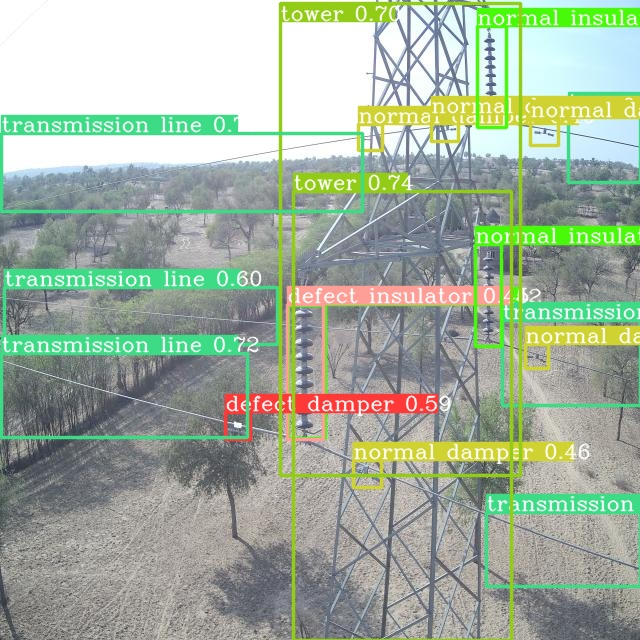

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0029-1_jpg.rf.6f0e80345702393dfc6ea60654688623.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0029-2_jpg.rf.f305d46ee3f231a59044de86e654fff6.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0029-2_jpg.rf.f305d46ee3f231a59044de86e654fff6.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 12.25it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0031-2_jpg.rf.9efd24185a8a0f665e13fef772d77f73.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0031-2_jpg.rf.9efd24185a8a0f665e13fef772d77f73.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 12.55it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0031_jpg.rf.b5b36facd98a2d6a607679828db31836.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0031_jpg.rf.b5b36facd98a2d6a607679828db31836.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 12.33it/s]
Results saved to runs/inference/exp


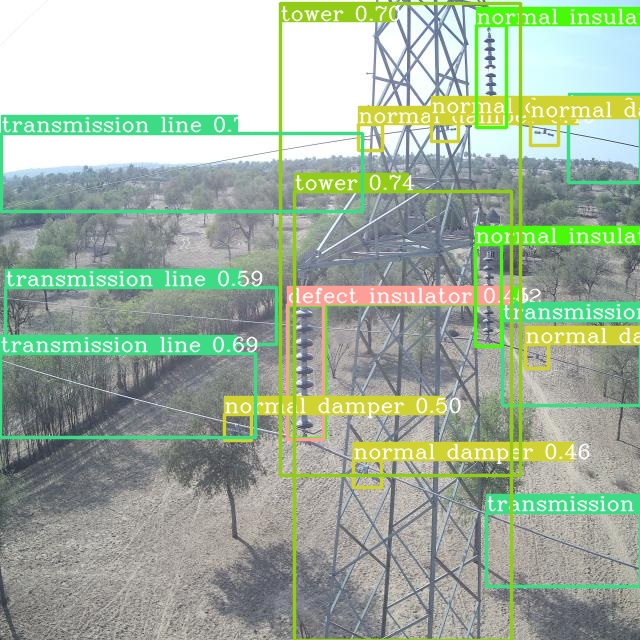

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0029-2_jpg.rf.f305d46ee3f231a59044de86e654fff6.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

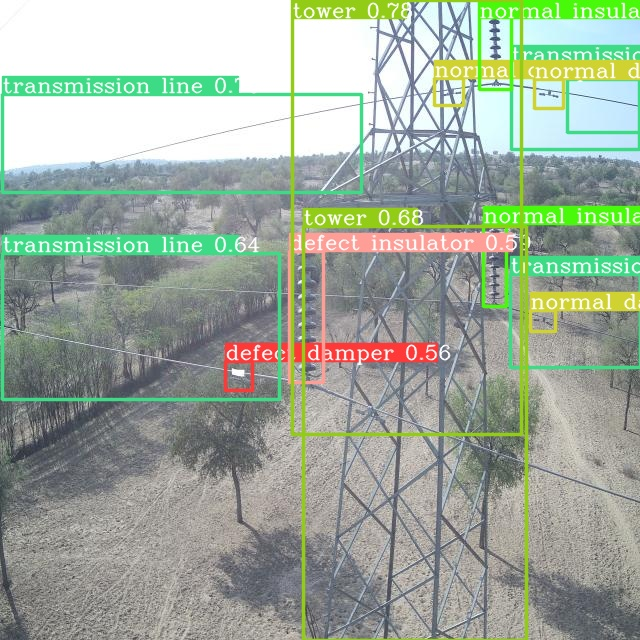

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0031-2_jpg.rf.9efd24185a8a0f665e13fef772d77f73.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

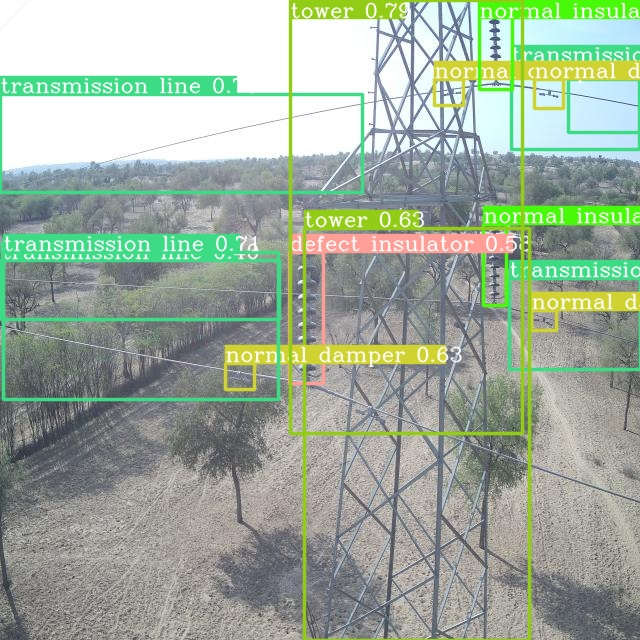

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0031_jpg.rf.b5b36facd98a2d6a607679828db31836.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source  /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0035-1_jpg.rf.9f984fe69fcef09a522c9e021c9d66fd.jpg --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0035-1_jpg.rf.9f984fe69fcef09a522c9e021c9d66fd.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 11.44it/s]
Results saved to runs/inference/exp


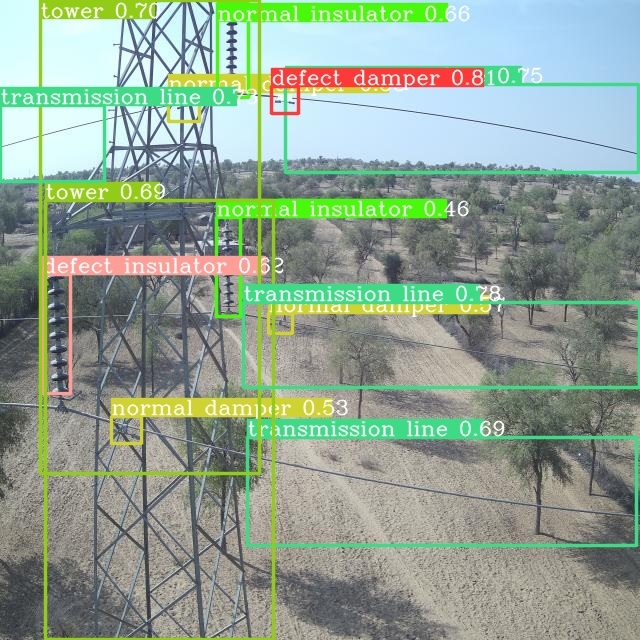

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0035-1_jpg.rf.9f984fe69fcef09a522c9e021c9d66fd.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0043-1_jpg.rf.8d95811d471d25fd9117c25746f84f5a.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0043-1_jpg.rf.8d95811d471d25fd9117c25746f84f5a.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:01<00:00,  1.96s/it]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0043_jpg.rf.3b007c3b7b91b4138188dc0492b5c583.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0043_jpg.rf.3b007c3b7b91b4138188dc0492b5c583.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:01<00:00,  1.93s/it]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0045_jpg.rf.9aaf6d1c70734bbe493ab80db4a0af97.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0045_jpg.rf.9aaf6d1c70734bbe493ab80db4a0af97.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00,  1.36it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source  /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0047-2_jpg.rf.8e149d98f2be8c3d023e23a27ae5ac83.jpg      --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0047-2_jpg.rf.8e149d98f2be8c3d023e23a27ae5ac83.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00,  1.15it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0049-1_jpg.rf.3e9537095edb49019a414301169584b7.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0049-1_jpg.rf.3e9537095edb49019a414301169584b7.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:01<00:00,  1.67s/it]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0051-1_jpg.rf.40d9ed3548bf5592ab3b22d1525f5073.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0051-1_jpg.rf.40d9ed3548bf5592ab3b22d1525f5073.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 11.68it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0061-1_jpg.rf.01743cd7069537ceb488989cf99f1d26.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0061-1_jpg.rf.01743cd7069537ceb488989cf99f1d26.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 16.56it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0065-3_jpg.rf.c8ecff27a2cf5e041699730de215e638.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0065-3_jpg.rf.c8ecff27a2cf5e041699730de215e638.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 14.87it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0081_jpg.rf.1bf3b1322790d399769677602c95bca6.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0081_jpg.rf.1bf3b1322790d399769677602c95bca6.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 14.72it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0083_jpg.rf.10929628829f8b41d32abae905c7b1c2.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0083_jpg.rf.10929628829f8b41d32abae905c7b1c2.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 15.94it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0087_jpg.rf.3e31e3cd6d9fea5098d12af3f5f312d6.jpg --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0087_jpg.rf.3e31e3cd6d9fea5098d12af3f5f312d6.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 11.91it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0089-1_jpg.rf.f8a028a2229bf30beaf6c69d665dac32.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0089-1_jpg.rf.f8a028a2229bf30beaf6c69d665dac32.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 16.57it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0093_jpg.rf.cd6226f59865b2a902192eb29d588558.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0093_jpg.rf.cd6226f59865b2a902192eb29d588558.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 16.86it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0097-1_jpg.rf.73ed58e058275ee703a1ac23e72666c6.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0097-1_jpg.rf.73ed58e058275ee703a1ac23e72666c6.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00,  9.58it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0097-3_jpg.rf.5d371210e9efbb6cabea8420a3335f3f.jpg --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0097-3_jpg.rf.5d371210e9efbb6cabea8420a3335f3f.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 15.97it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0101-2_jpg.rf.b7760674292ae6cbcf0ddb061bbff639.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0101-2_jpg.rf.b7760674292ae6cbcf0ddb061bbff639.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 14.95it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source  /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0101_jpg.rf.21391cfc42552b44e6c4849de9ee5c58.jpg --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0101_jpg.rf.21391cfc42552b44e6c4849de9ee5c58.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 16.99it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0109_jpg.rf.501ff68baaeec9f33a71cd50e9812b72.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0109_jpg.rf.501ff68baaeec9f33a71cd50e9812b72.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00,  1.50it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0111-1_jpg.rf.9d53a1089d531dfa59f2f54986730222.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0111-1_jpg.rf.9d53a1089d531dfa59f2f54986730222.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 13.33it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0113-2_jpg.rf.3436b078b2ddb73d42eb616db1a22e10.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0113-2_jpg.rf.3436b078b2ddb73d42eb616db1a22e10.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 16.45it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0114-3_jpg.rf.638ad21e34d4c7b2f948367d306adb8d.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0114-3_jpg.rf.638ad21e34d4c7b2f948367d306adb8d.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 17.02it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0114-4_jpg.rf.374cf8ad5b90054beaed93a7cdda0e31.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0114-4_jpg.rf.374cf8ad5b90054beaed93a7cdda0e31.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 17.36it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0114-4_jpg.rf.374cf8ad5b90054beaed93a7cdda0e31.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0114-4_jpg.rf.374cf8ad5b90054beaed93a7cdda0e31.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 16.80it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0115_jpg.rf.5af7faf706da829cb4c403b0b5d4c3f1.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0115_jpg.rf.5af7faf706da829cb4c403b0b5d4c3f1.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 15.93it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0116-4_jpg.rf.4e7229188df2680e9fb5d7f1b546733d.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0116-4_jpg.rf.4e7229188df2680e9fb5d7f1b546733d.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 13.91it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0117-3_jpg.rf.07c86f747fbf1e7255036bd9f6bdd9e1.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0117-3_jpg.rf.07c86f747fbf1e7255036bd9f6bdd9e1.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 11.77it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0120_jpg.rf.604199b403c251bdae193ee4c1b71988.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0120_jpg.rf.604199b403c251bdae193ee4c1b71988.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00,  3.08it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0121-3_jpg.rf.c4e7e1716477cd09f2d2d24c7fb9144d.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0121-3_jpg.rf.c4e7e1716477cd09f2d2d24c7fb9144d.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 12.58it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0123-2_jpg.rf.e5726e2a066d1f016b4c44c18d3bb621.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0123-2_jpg.rf.e5726e2a066d1f016b4c44c18d3bb621.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 15.55it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0124-3_jpg.rf.31b174d911aeb8c1d2924e6811cee967.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0124-3_jpg.rf.31b174d911aeb8c1d2924e6811cee967.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 15.85it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml  --weights /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt --source /content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0125-4_jpg.rf.8972256c50c088c56f21a35b3e63f819.jpg  --device 0

Namespace(weights='/content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt', source='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/images/test/DJI_0125-4_jpg.rf.8972256c50c088c56f21a35b3e63f819.jpg', webcam=False, webcam_addr='0', yaml='/content/gdrive/MyDrive/YOLOv6/Transmission-dataset--T51,T52,T53,T54,T55,T56-1/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from /content/gdrive/MyDrive/YOLOv6/exp/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 16.04it/s]
Results saved to runs/inference/exp


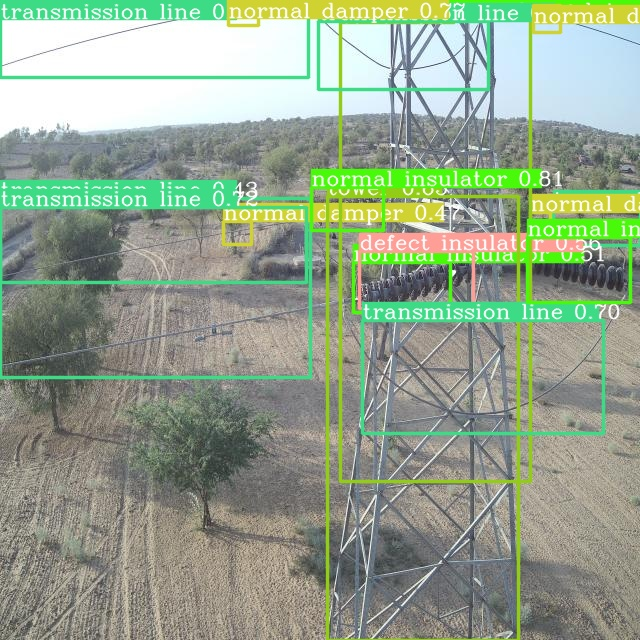

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0043-1_jpg.rf.8d95811d471d25fd9117c25746f84f5a.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

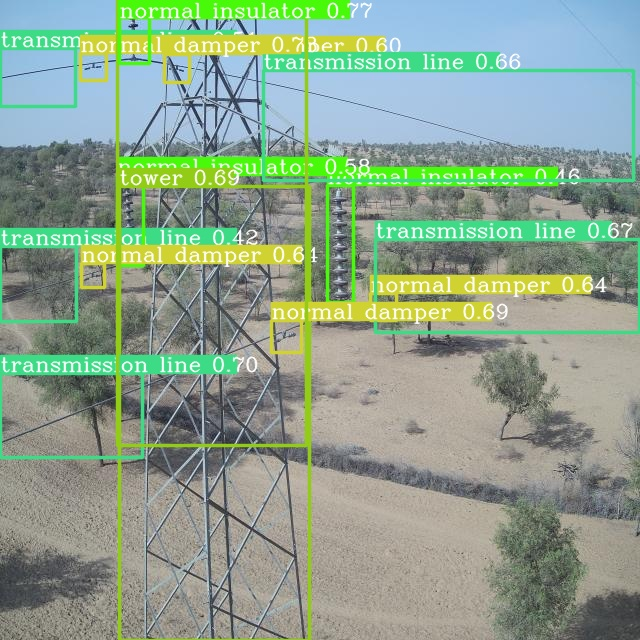

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0043_jpg.rf.3b007c3b7b91b4138188dc0492b5c583.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

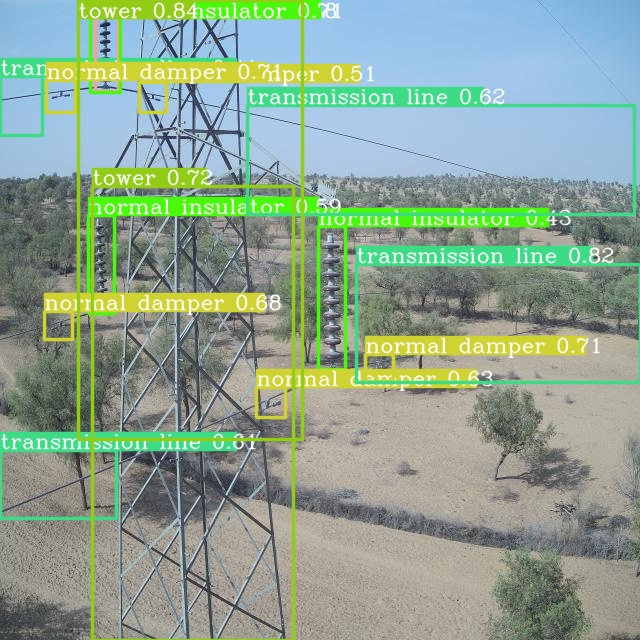

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0045_jpg.rf.9aaf6d1c70734bbe493ab80db4a0af97.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

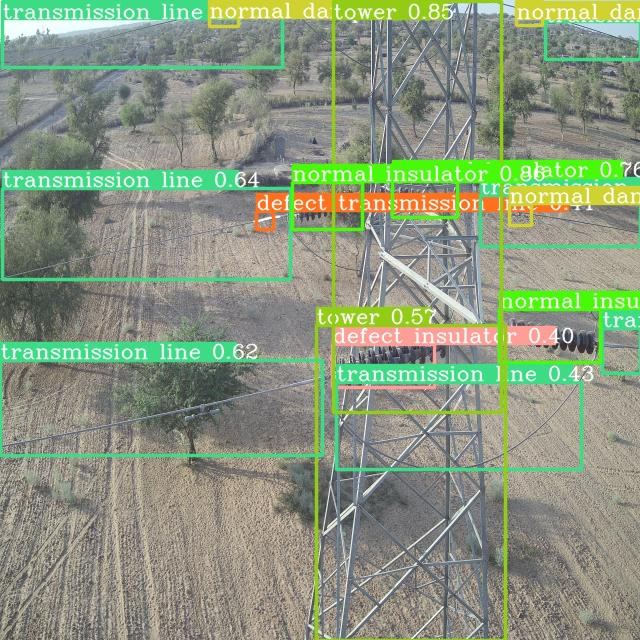

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0047-2_jpg.rf.8e149d98f2be8c3d023e23a27ae5ac83.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

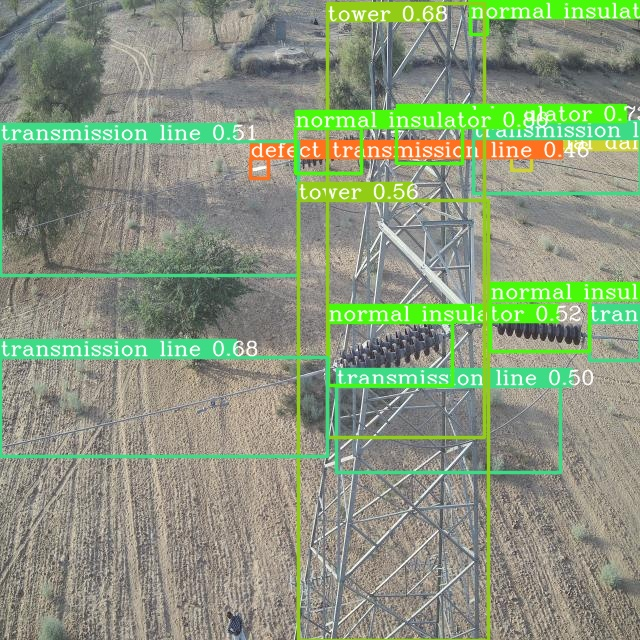

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0049-1_jpg.rf.3e9537095edb49019a414301169584b7.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

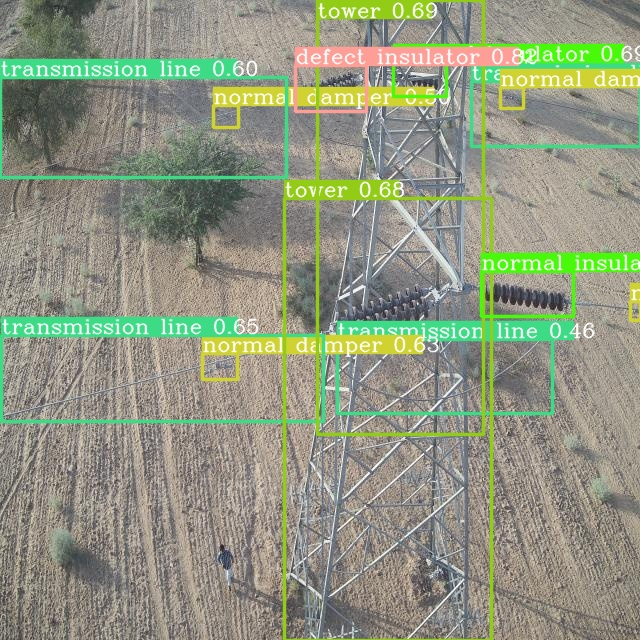

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0051-1_jpg.rf.40d9ed3548bf5592ab3b22d1525f5073.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

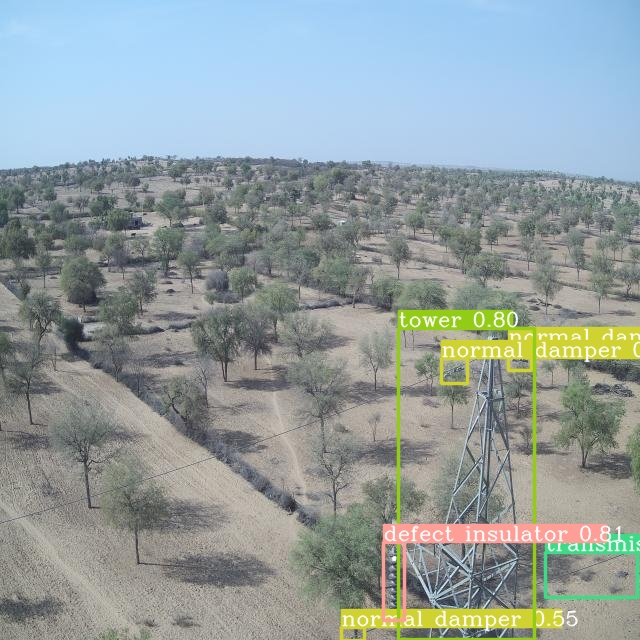

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0061-1_jpg.rf.01743cd7069537ceb488989cf99f1d26.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

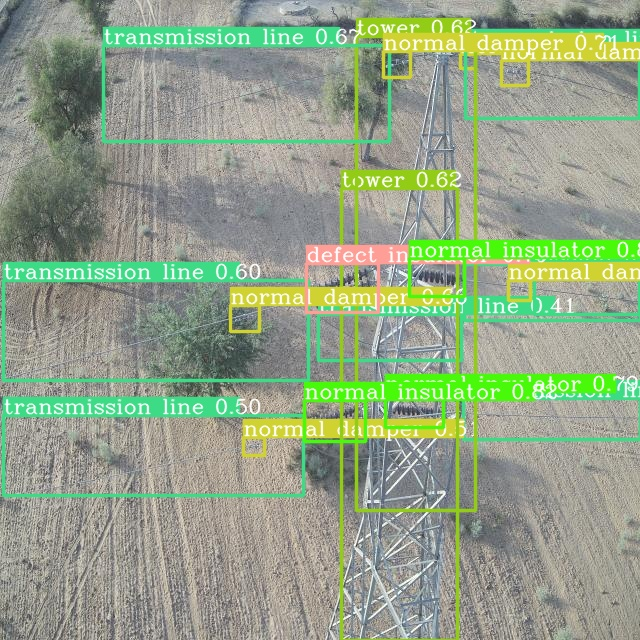

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0065-3_jpg.rf.c8ecff27a2cf5e041699730de215e638.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

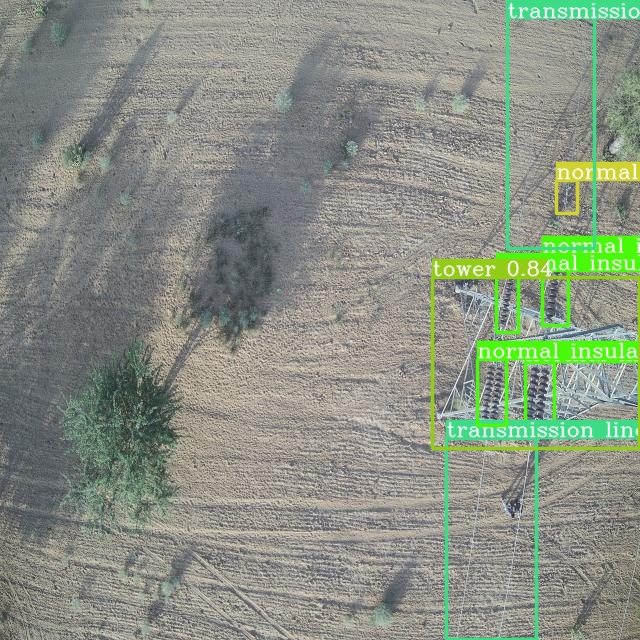

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0081_jpg.rf.1bf3b1322790d399769677602c95bca6.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

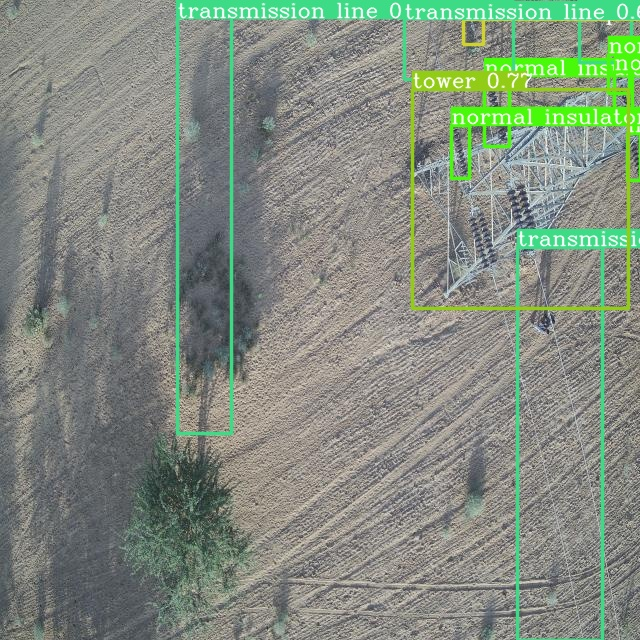

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0083_jpg.rf.10929628829f8b41d32abae905c7b1c2.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

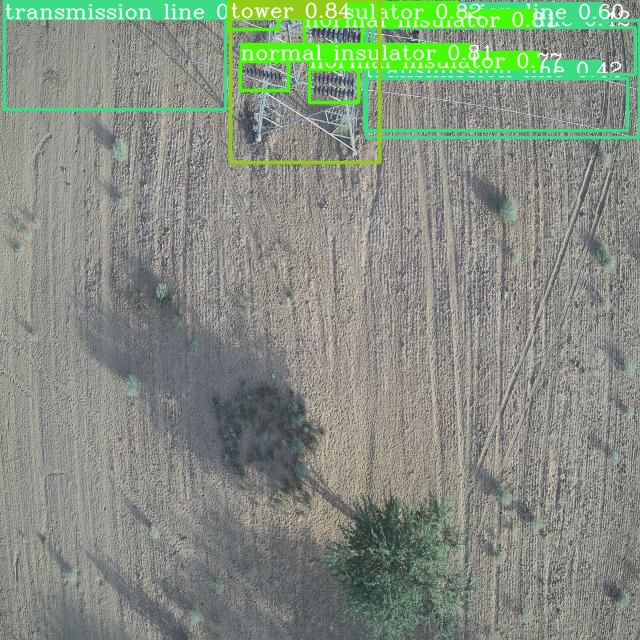

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0087_jpg.rf.3e31e3cd6d9fea5098d12af3f5f312d6.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

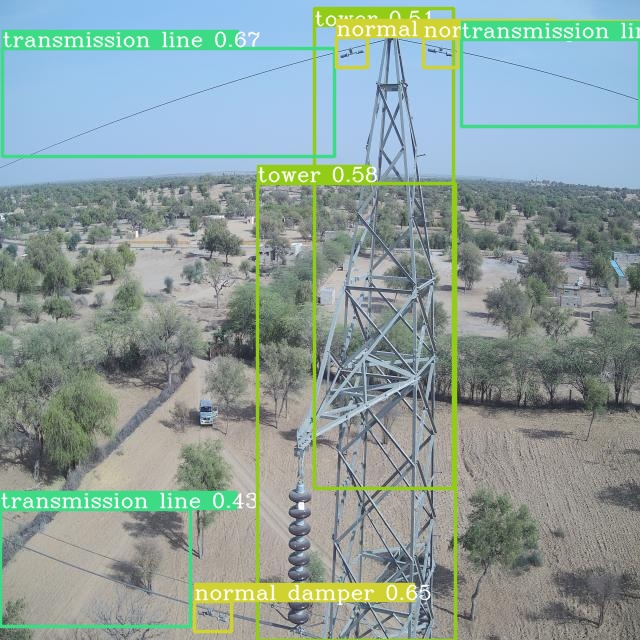

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0089-1_jpg.rf.f8a028a2229bf30beaf6c69d665dac32.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

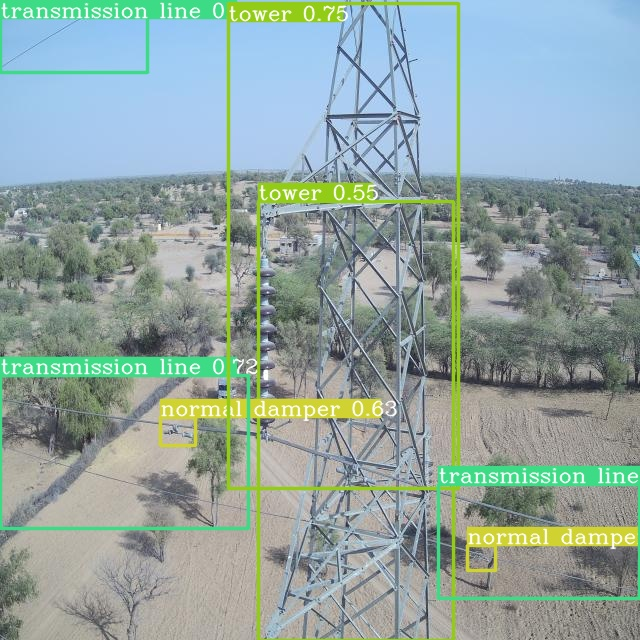

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0093_jpg.rf.cd6226f59865b2a902192eb29d588558.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

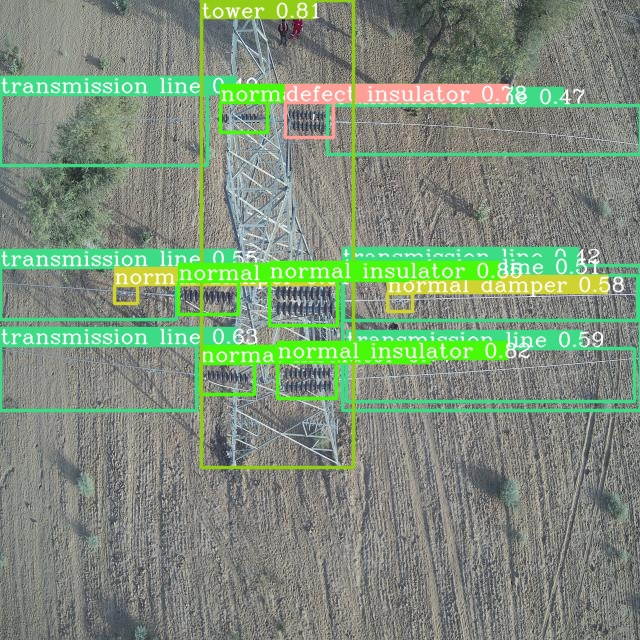

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0097-1_jpg.rf.73ed58e058275ee703a1ac23e72666c6.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

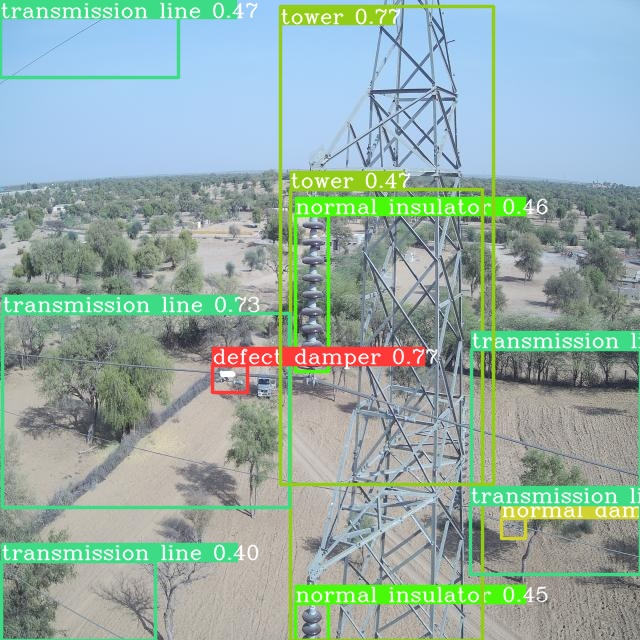

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0097-3_jpg.rf.5d371210e9efbb6cabea8420a3335f3f.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

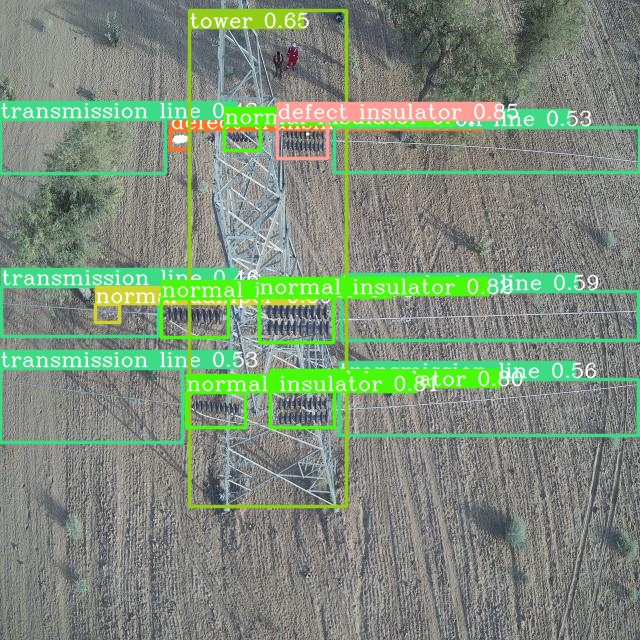

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0101-2_jpg.rf.b7760674292ae6cbcf0ddb061bbff639.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

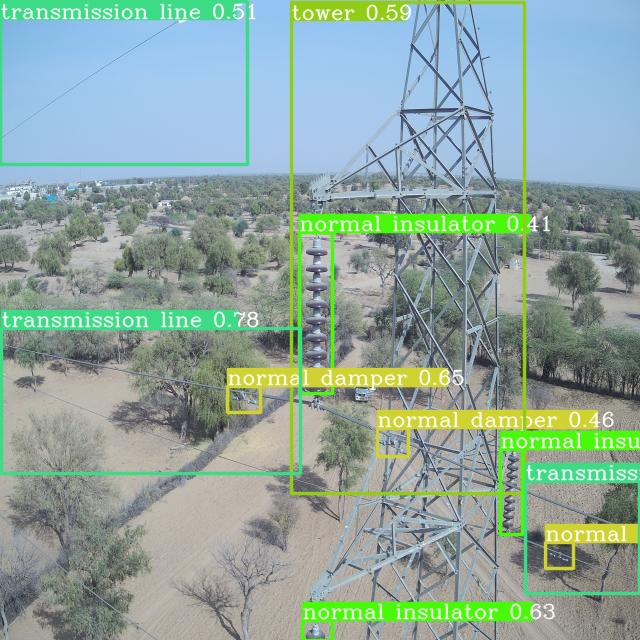

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0101_jpg.rf.21391cfc42552b44e6c4849de9ee5c58.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

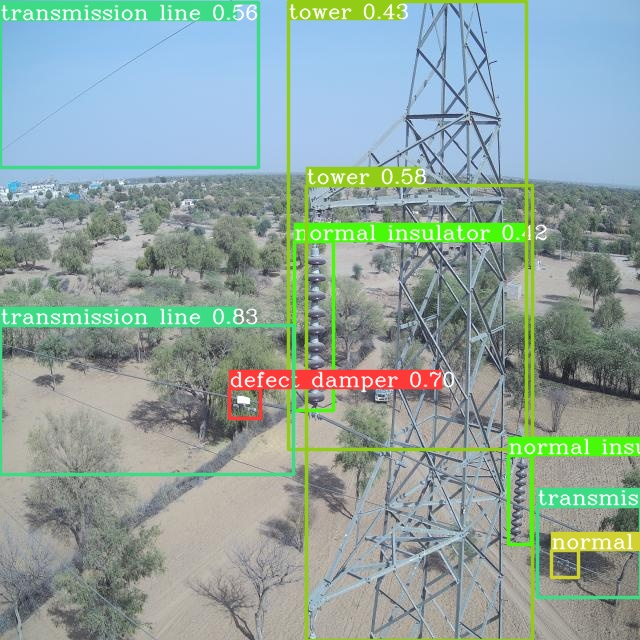

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0109_jpg.rf.501ff68baaeec9f33a71cd50e9812b72.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

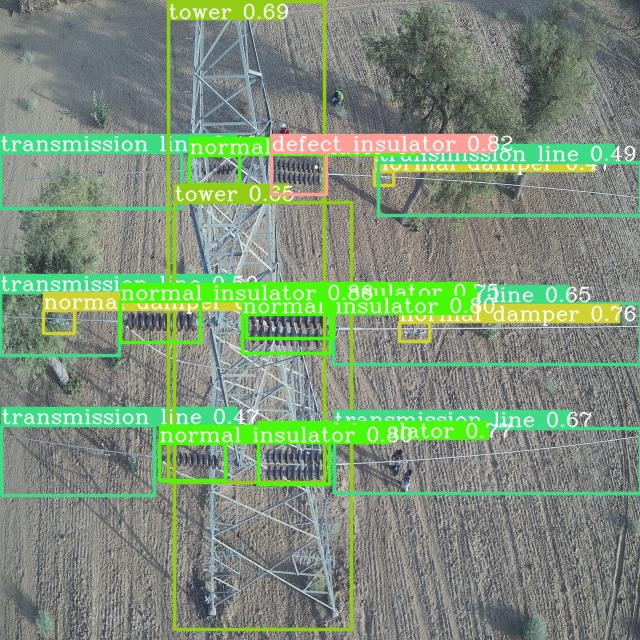

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0111-1_jpg.rf.9d53a1089d531dfa59f2f54986730222.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

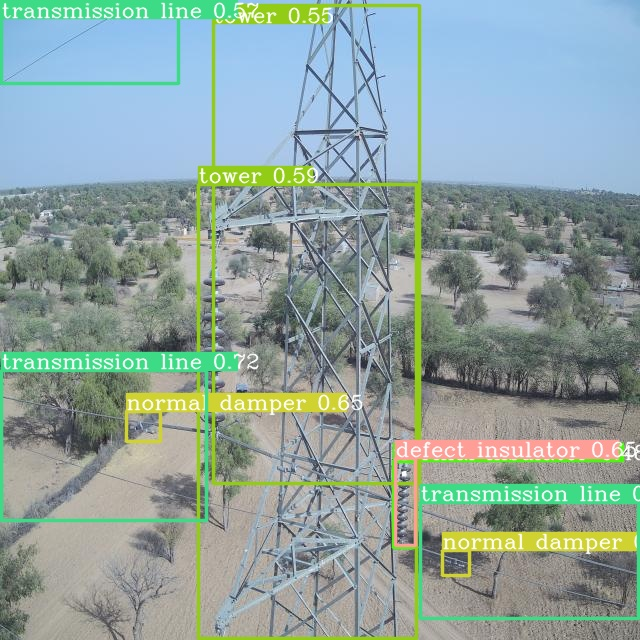

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0113-2_jpg.rf.3436b078b2ddb73d42eb616db1a22e10.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

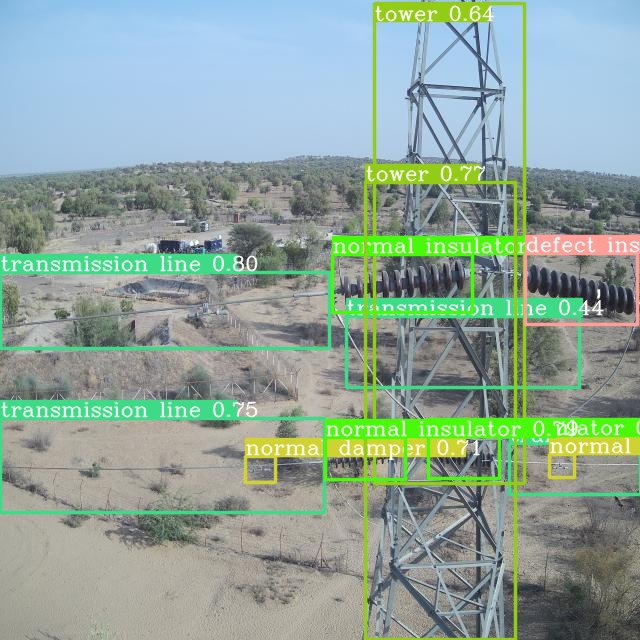

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0114-3_jpg.rf.638ad21e34d4c7b2f948367d306adb8d.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

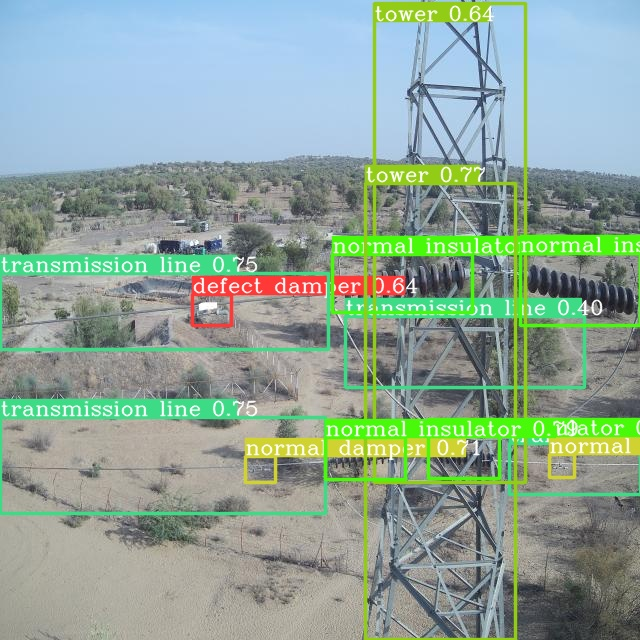

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0114-4_jpg.rf.374cf8ad5b90054beaed93a7cdda0e31.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

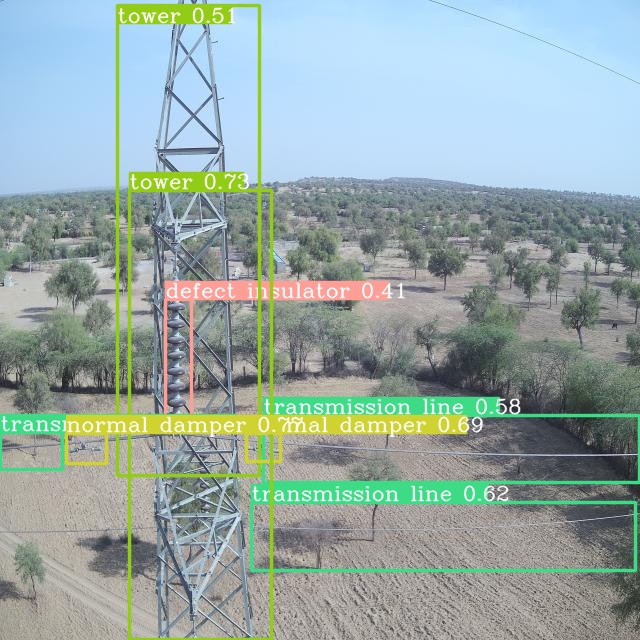

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0115_jpg.rf.5af7faf706da829cb4c403b0b5d4c3f1.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

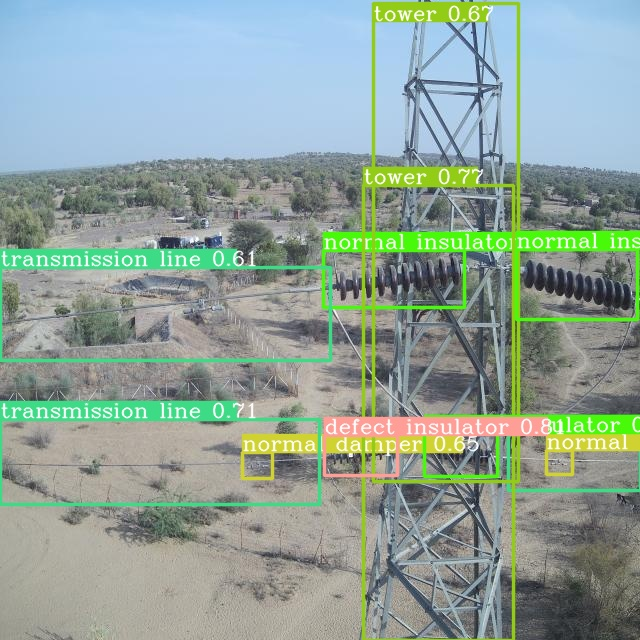

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0116-4_jpg.rf.4e7229188df2680e9fb5d7f1b546733d.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

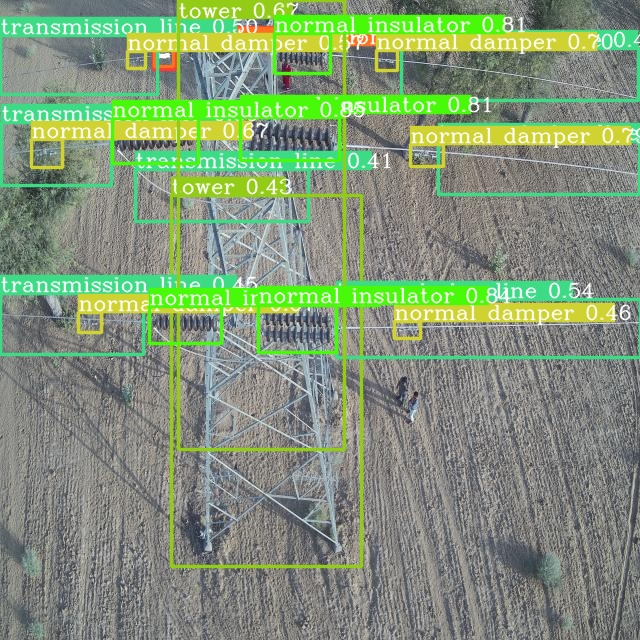

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0117-3_jpg.rf.07c86f747fbf1e7255036bd9f6bdd9e1.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

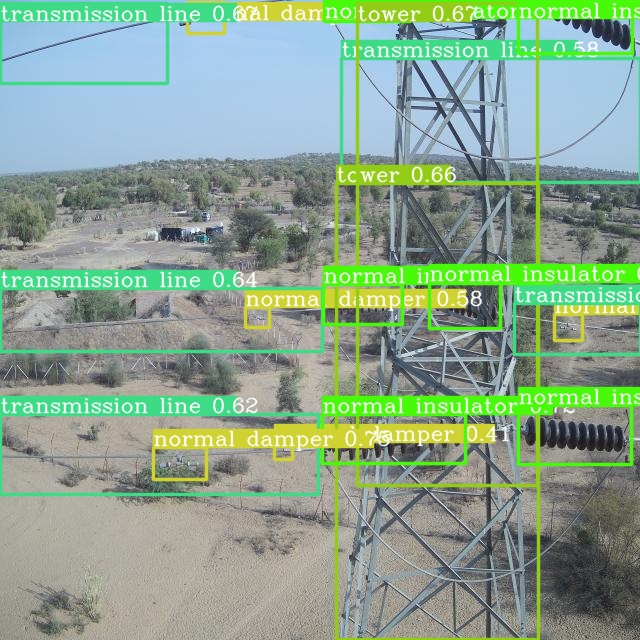

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0120_jpg.rf.604199b403c251bdae193ee4c1b71988.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

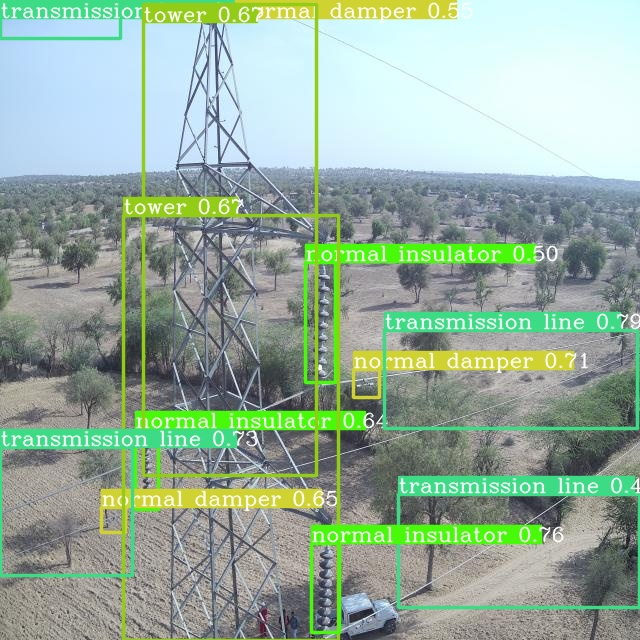

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0121-3_jpg.rf.c4e7e1716477cd09f2d2d24c7fb9144d.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

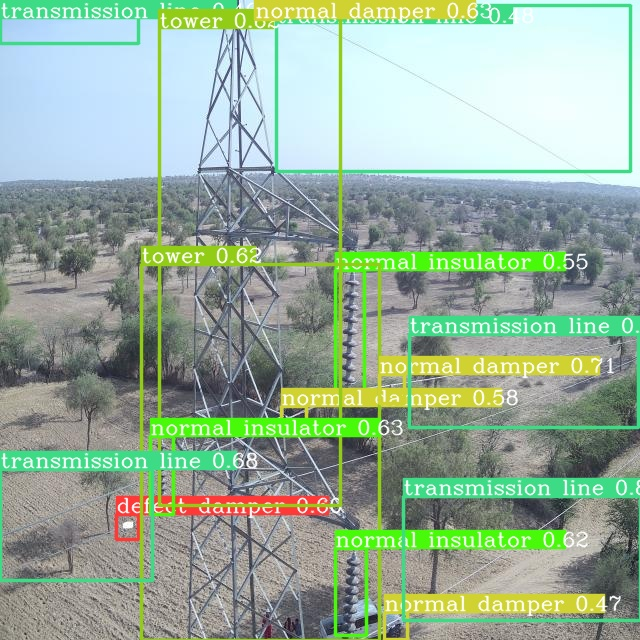

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0123-2_jpg.rf.e5726e2a066d1f016b4c44c18d3bb621.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

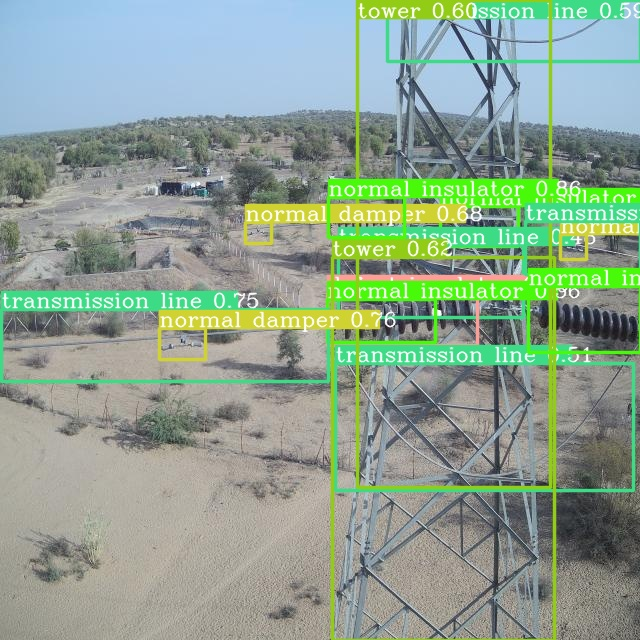

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0124-3_jpg.rf.31b174d911aeb8c1d2924e6811cee967.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

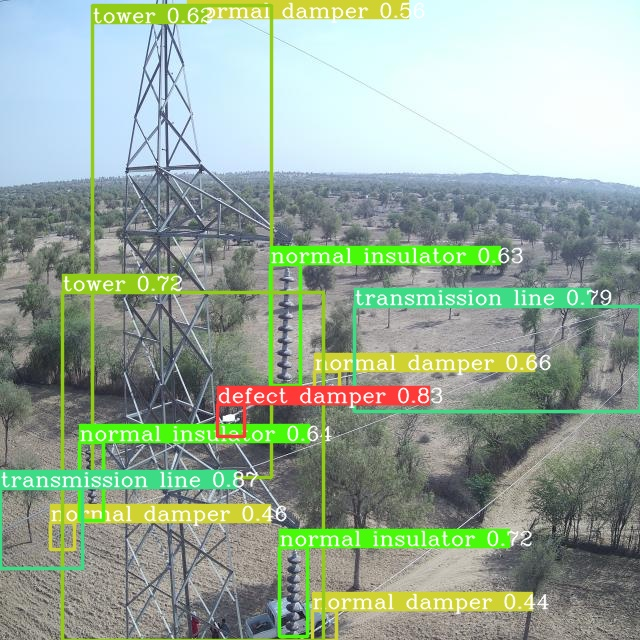

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0125-4_jpg.rf.8972256c50c088c56f21a35b3e63f819.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1